<a href="https://colab.research.google.com/github/SihaoCheng/scattering_transform/blob/master/scattering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# run it any time you want to have last version of the code
!rm -rf '/content/scattering_transform/'
!git clone 'https://github.com/SihaoCheng/scattering_transform.git' '/content/scattering_transform'

Cloning into '/content/scattering_transform'...
remote: Enumerating objects: 647, done.
remote: Counting objects: 100% (355/355), done.
remote: Compressing objects: 100% (154/154), done.
remote: Total 647 (delta 200), reused 355 (delta 200), pack-reused 292
Receiving objects: 100% (647/647), 162.08 MiB | 22.68 MiB/s, done.
Resolving deltas: 100% (342/342), done.


In [ ]:
# mount google drive
# from google.colab import drive
# drive.mount('/content/drive', force_remount=True)

# import packages
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.fft

# change the path below to where you download the scattering package
import sys
sys.path.append('/content/scattering_transform/')
# import os
# os.chdir('/content/scattering')

# import scattering package
import scattering

# change the path below to where you download the data
# data_dir = '/content/drive/MyDrive/Colab Notebooks/'

use torch backend


In [ ]:
import scattering
import importlib
importlib.reload(scattering)

<module 'scattering' from '/content/scattering_transform/scattering/__init__.py'>

# 1. Analysis Examples

In [ ]:
# define calculator 
# the default device is gpu. If no gpu is found, it will automatically use cpu.
# to enforce use of cpu, set device='cpu' when defining the calculator)
M = N = 256; J = 7; L = 8
st_calc = scattering.Scattering2d(M, N, J, L) 

## 1.1 one-field scattering

In [ ]:
# load image (should have a shape of [N_image, N_xpix, N_ypix], 
# with a type of either numpy array or torch tensor.)
image_input = np.load(scattering.dirpath + '/example_fields.npy')[0:1,:M,:N]

# calculate scattering statistics (mean and correlation)
s_mean = st_calc.scattering_coef(image_input)
s_cov  = st_calc.scattering_cov (image_input)
print('size of flattened isotropic scattering (mean) coefs: ', s_mean['for_synthesis_iso'].shape)
print('size of flattened isotropic scattering correlation coefs: ', s_cov['for_synthesis_iso'].shape)
print('size of index of flattened scattering correlation coefs: ', s_cov['index_for_synthesis_iso'].shape)

size of flattened isotropic scattering (mean) coefs:  torch.Size([1, 231])
size of flattened isotropic scattering correlation coefs:  torch.Size([1, 11215])
size of index of flattened scattering correlation coefs:  torch.Size([7, 11215])


## 1.2 two-field scattering

In [ ]:
# load image (image1,2 should have a shape of [N_image, N_xpix, N_ypix])
image1 = np.load(scattering.dirpath + '/example_fields.npy')[0:1,:M,:N]
image2 = np.load(scattering.dirpath + '/example_fields.npy')[1:2,:M,:N]

# calculate scattering correlations, including 1-field-auto and 2-field-cross terms
s_cov_2fields = st_calc.scattering_cov_2fields(image1, image2)
print('size of isotropic scattering correlations: ', s_cov_2fields['for_synthesis_iso'].shape)
print('size of isotropic C11 coef: ', s_cov_2fields['Corr11_iso'].shape)

size of isotropic scattering correlations:  torch.Size([1, 43038])
size of isotropic C11 coef:  torch.Size([1, 4, 7, 7, 7, 8, 8])


## 1.3 other statistics (1-field)

In [ ]:
# load image (should have a shape of [N_image, N_xpix, N_ypix])
M = N = 256; J = 7; L = 4
image_input = np.load(scattering.dirpath + '/example_fields.npy')[:1,:M,:N]
# alpha-scattering (cov)
ac_calc = scattering.AlphaScattering2d_cov(M, N, J, L)
# bispectrum
k_range = np.logspace(0,np.log10(M/2*1.4), J-1)
bi_calc = scattering.Bispectrum_Calculator(k_range, M, N)
# calculate estimators
alpha_cov = ac_calc.forward(image_input)
bi = bi_calc.forward(image_input)
print('size of alpha_cov coefficients: ', alpha_cov.shape)
print('size of bispectrum coefficients: ', bi.shape)

number of moments (without low-pass and harr):  44096
this chunk 0  size is  832  among  832
size of alpha_cov coefficients:  torch.Size([1, 10870])
size of bispectrum coefficients:  torch.Size([1, 35])


# 2. generative model examples

## 2.1 texture generation, given a target image(s)

input_size:  (1, 256, 256)
# of estimators:  2927
max residual:  6.3487434 , mean residual:  0.018660009
max residual:  0.004006067 , mean residual:  0.0001453651
time used:  32.17902708053589 s


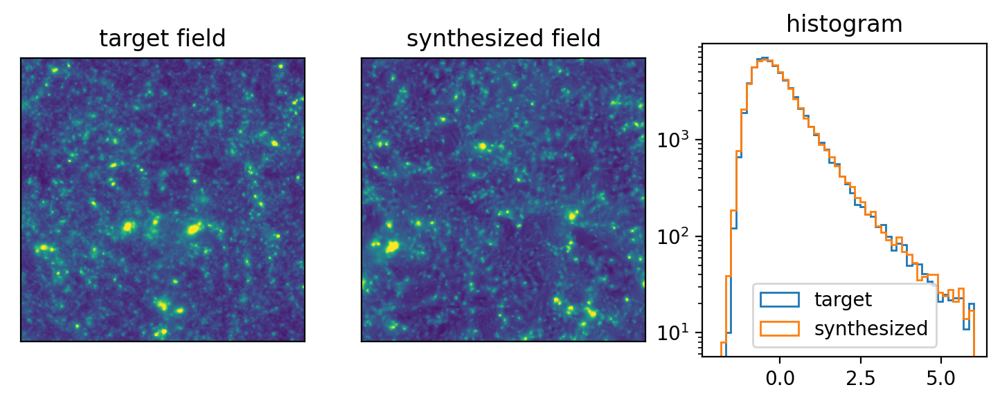

In [ ]:
# load image
image_target = scattering.whiten(np.load(scattering.dirpath + '/example_fields.npy')[:1])
# synthesize
image_syn = scattering.synthesis('s_cov_iso', image_target, seed=0)
# show
scattering.show(image_target, image_syn, (-2, 6))

## 2.2 synthesis with threshold-clipping

### 2.2.1 generation with FT of scale/angle (Rudy)

input_size:  (2, 256, 256)
# of estimators:  2927
max residual:  6.3487434 , mean residual:  0.012659681
max residual:  0.008095424 , mean residual:  0.00038829583
time used:  13.808298587799072 s


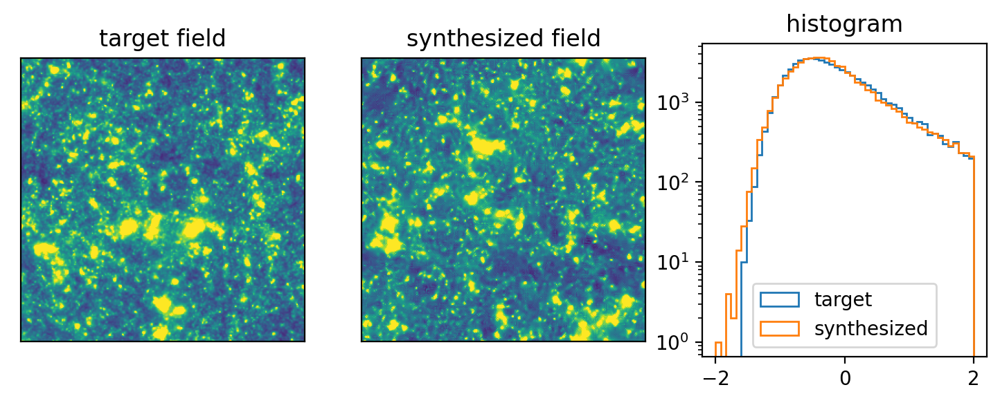

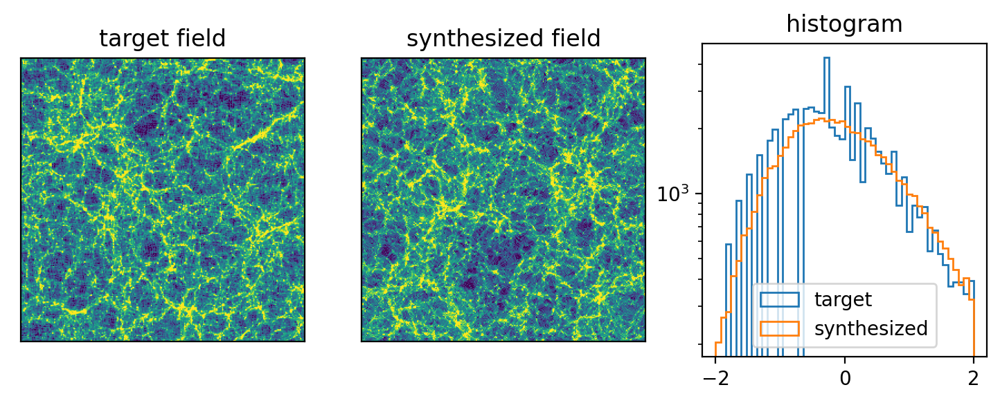

In [ ]:
from pathlib import Path

from scattering.angle_transforms import FourierAngle
from scattering.scale_transforms import FourierScale
from scattering.utils import to_numpy
from scattering import scale_annotation_a_b

fourier_angle = True
fourier_scale = True

# initialize Fourier-like operators along angles and scales, 
# these classes are simply composed of one method + stores information (ex: Cosine basis)
angle_operator = FourierAngle()
scale_operator = FourierScale()

# the moments function to pass to "synthesis"
def moments(s_cov, params):
    idx_info = to_numpy(s_cov['index_for_synthesis_iso']).T
    idx_info = scale_annotation_a_b(idx_info)
    coef = s_cov['for_synthesis_iso']

    if fourier_angle:
        coef , idx_info = angle_operator(coef , idx_info)
    if fourier_scale:
        coef , idx_info = scale_operator(coef , idx_info)

    return coef 

# data loading
im1_path = Path(scattering.dirpath) / 'example_fields.npy'
image_target = np.load(str(im1_path))[:2]

# synthesis
image_syn = scattering.synthesis('s_cov_func', image_target, s_cov_func=moments, J=7, steps=100, seed=0)
scattering.show(image_target, image_syn, (-2,2))

input_size:  (6, 256, 256)
# of estimators:  8460
max residual:  8.155242624983712 , mean residual:  0.025225250587424797
max residual:  0.007206643665479938 , mean residual:  0.00036549168265915605
time used:  76.52314591407776 s


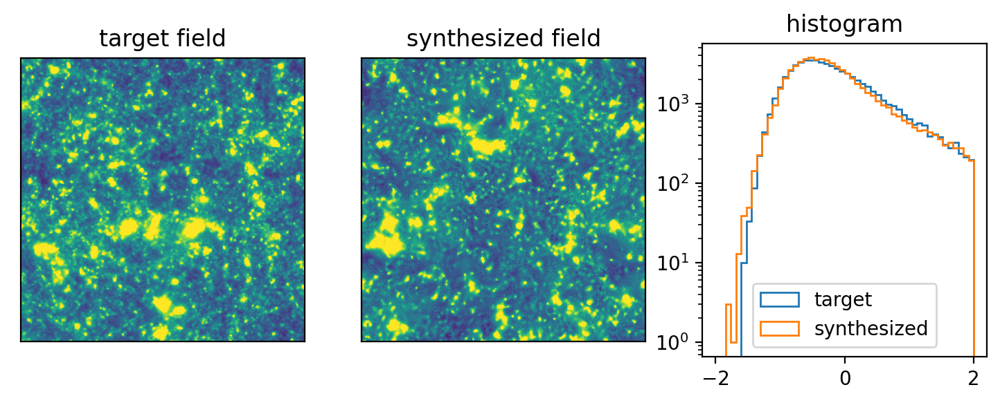

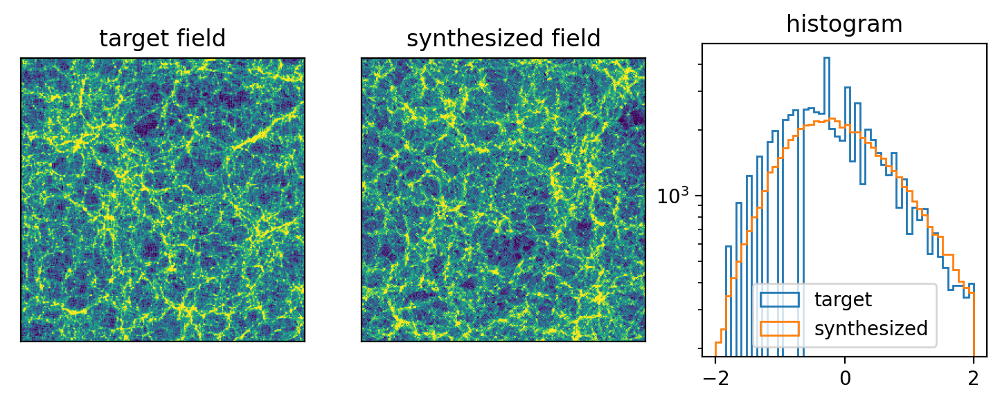

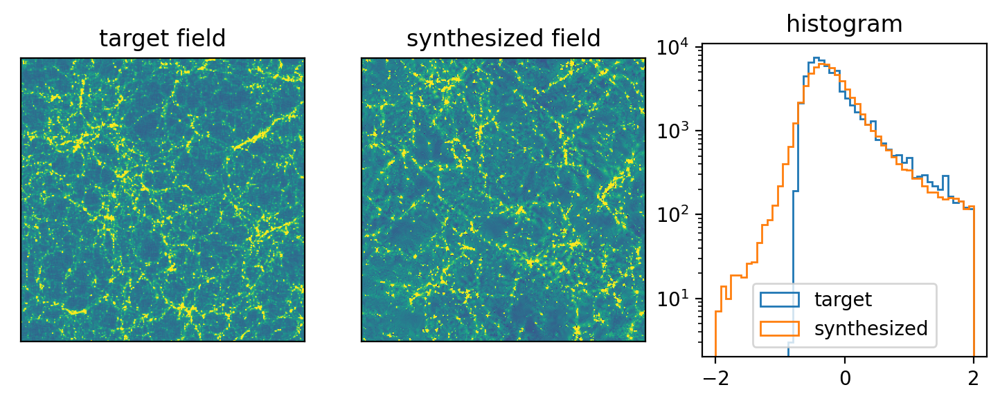

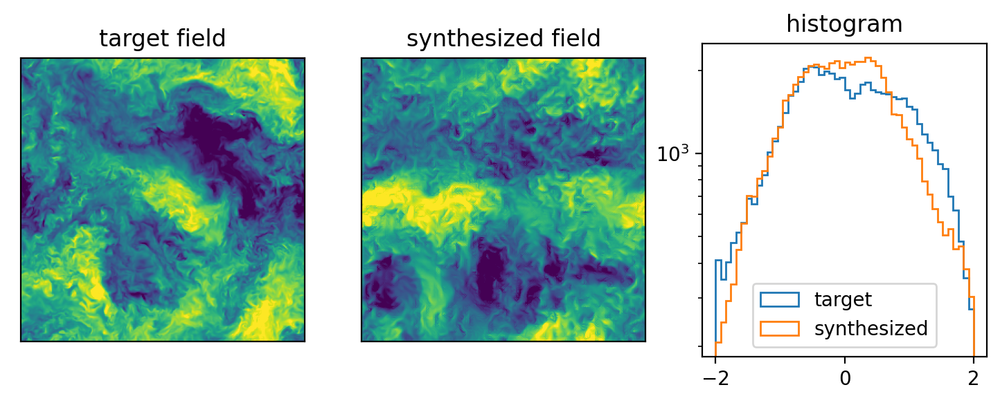

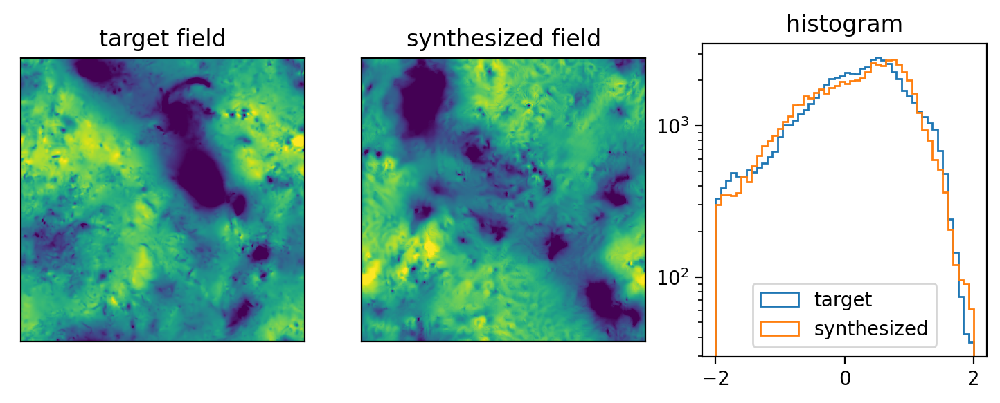

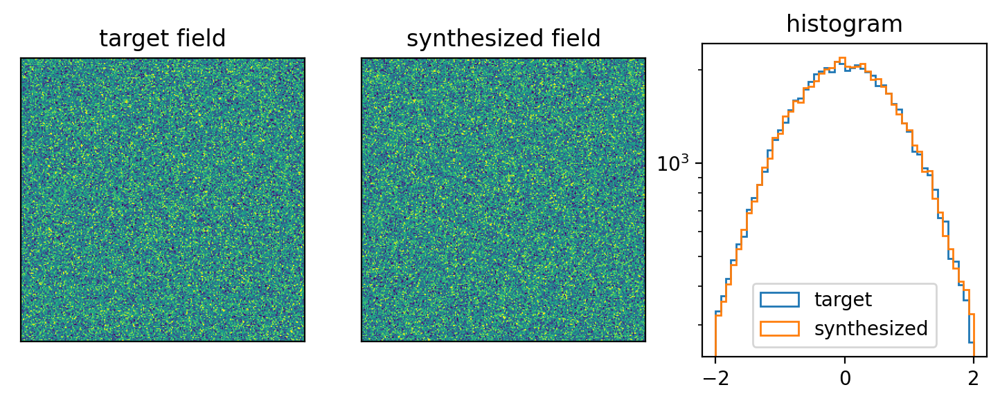

In [ ]:
# scale/angular transform + thresholding clipping
from pathlib import Path

from scattering.angle_transforms import FourierAngle
from scattering.scale_transforms import FourierScale
from scattering.utils import to_numpy
from scattering import scale_annotation_a_b


def prepare_func(image_target, fourier_angle, fourier_scale, lamb):
    angle_operator = FourierAngle()
    scale_operator = FourierScale()

    def moments(s_cov, params=[], mask=None):
        idx_info = to_numpy(s_cov['index_for_synthesis_iso']).T
        idx_info = scale_annotation_a_b(idx_info)
        coef = s_cov['for_synthesis_iso']

        if fourier_angle:
            coef, idx_info = angle_operator(coef, idx_info)
        if fourier_scale:
            coef, idx_info = scale_operator(coef, idx_info)
        return coef[mask] if mask is not None else coef

    # scattering model
    st_calc = scattering.Scattering2d(M=256, N=256, J=7, L=4)
    
    # compute target s_cov
    s_cov = st_calc.scattering_cov(image_target)#, if_large_batch=True)

    for key in list(s_cov.keys()):
        if key not in ['index_for_synthesis_iso', 'for_synthesis_iso']:
            del s_cov[key]
    
    covs_target = moments(s_cov)
    
    # compute reference Gaussian s_cov
    s_cov_gaussian_l = []
    for i in range(5):
        X_gaussian = np.random.normal(0, 1, (50, st_calc.M, st_calc.N))
        s_cov_Gaussian = st_calc.scattering_cov(X_gaussian, if_large_batch=True)
        for key in list(s_cov_Gaussian.keys()):
            if key not in ['index_for_synthesis_iso', 'for_synthesis_iso']:
                del s_cov_Gaussian[key]
        s_cov_gaussian_l.append(moments(s_cov_Gaussian))
    covs_Gaussian = torch.cat(s_cov_gaussian_l)
    
    snr = (covs_target - covs_Gaussian.mean(0)[None,...]).abs() / covs_Gaussian.std(0)[None,...]
    mask = snr > lamb

    moments_mask = lambda s_cov, params: moments(s_cov, params, mask=mask)

    return moments, moments_mask, mask, snr

steps = 300
lamb = 1.0

fourier_angle = True
fourier_scale = True

# data loading
im1_path = Path(scattering.dirpath) / 'example_fields.npy'
image_target = np.load(str(im1_path))[:5]
image_target = np.concatenate((image_target, np.random.normal(0,1,(1,256,256))))
image_target = np.float64(image_target)

# synthesis
mom_full, mom_reduced, mask, snr = prepare_func(image_target, fourier_angle=fourier_angle, fourier_scale=fourier_scale, lamb=lamb)
image_syn_reduced = scattering.synthesis(
    's_cov_func', image_target, s_cov_func=mom_reduced, J=7, L=4, 
    steps=steps, seed=0, precision='double')
# show
scattering.show(image_target, image_syn_reduced, (-2,2))

### 2.2.2 clipping with angular FT and white noise reference 

In [ ]:
# load image
image_target = scattering.whiten(
    np.load(scattering.dirpath + '/example_fields.npy')[:5])

# analysis
M, N = image_target.shape[1:]; J = 7; L = 4
st_calc = scattering.Scattering2d(M, N, J, L) 
s_cov  = st_calc.scattering_cov (image_target)
coef = s_cov['for_synthesis_iso']
index_type, j1, j2, j3, l1, l2, l3 = s_cov['index_for_synthesis_iso']

# Fourier transform for l2-l1 and l3-l1
C01_f, C11_f = scattering.fft_coef(coef, index_type, L)

# set naive threshold 
# epsilon = 1e-1
# select_C01 = C01_f.abs() > epsilon
# select_C11 = C11_f.abs() > epsilon
# set white gaussian noise reference threshold
lamb = 5
C01_f_ref_mean, C01_f_ref_std, C11_f_ref_mean, C11_f_ref_std = scattering.s_cov_WN(
    st_calc, N_realization=50, coef_name='for_synthesis_iso'
)
C01_snr = (C01_f - C01_f_ref_mean).abs()/C01_f_ref_std
C11_snr = (C11_f - C11_f_ref_mean).abs()/C11_f_ref_std
select_C01 = C01_snr > lamb
select_C11 = C11_snr > lamb

# synthesize
image_syn = scattering.synthesis('s_cov_func', image_target, seed=0, 
    s_cov_func=scattering.s_cov_iso_threshold, s_cov_func_params=[L, select_C01, select_C11])

input_size:  (5, 256, 256)
# of estimators:  4009
max residual:  8.155242 , mean residual:  0.051338516
max residual:  0.002483314 , mean residual:  8.357848e-05
time used:  41.914172887802124 s


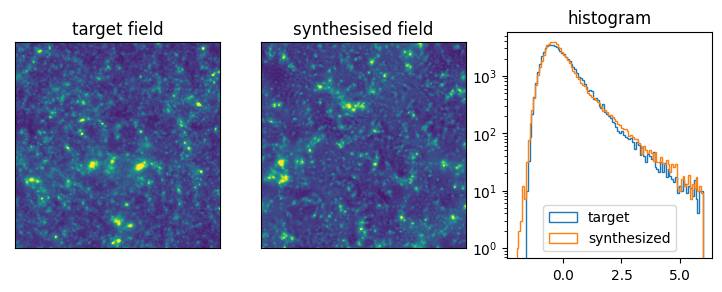

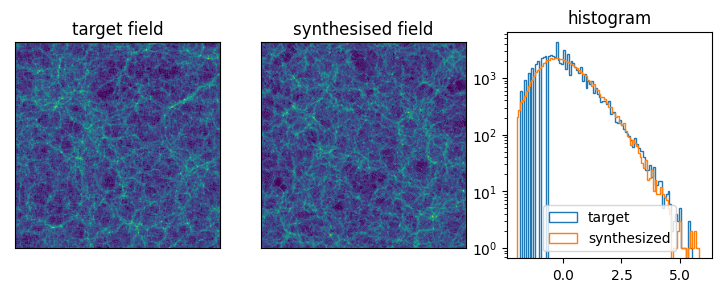

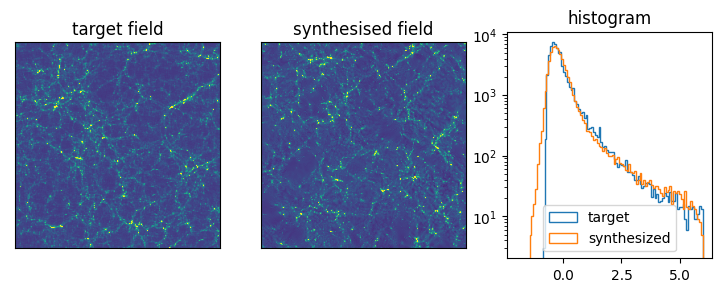

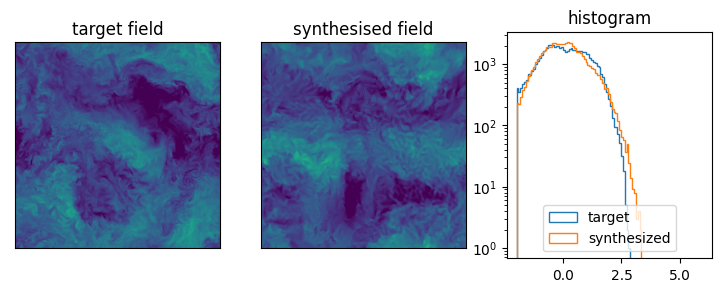

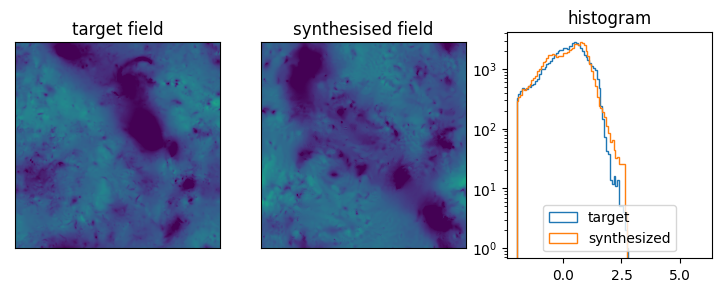

In [ ]:
# show
scattering.show(image_target, image_syn, (-2, 6))

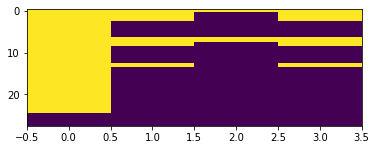

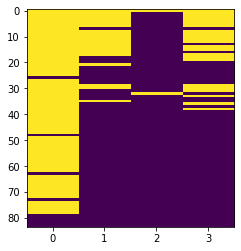

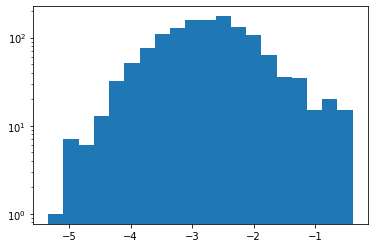

In [ ]:
plt.imshow(select_C01[0].abs().cpu(), aspect=0.05, interpolation='none'); plt.show()
plt.imshow(select_C11[0,:,0,:].abs().cpu(), aspect=0.05, interpolation='none'); plt.show()
plt.hist(C11_f[0].abs().flatten().cpu().log10(),20); plt.yscale('log'); plt.show()

### 2.2.1 load texture images

In [ ]:
# load image
image_target = scattering.whiten(np.load(scattering.dirpath + '/example_fields.npy')[0:5])
import cv2
swirl = cv2.imread(data_dir + 'texture/swirly2.jpg')[None,:256,:256,0]
leaf = cv2.imread(data_dir + 'texture/flower_bed.jpg')[None,:256,:256,0]
flower_bed = cv2.imread(data_dir + 'texture/leaves.jpg')[None,:256,:256,0]
sticks = cv2.imread(data_dir + 'texture/sticks.jpg')[None,:256,:256,0]
wood = cv2.imread(data_dir + 'texture/wood.jpg')[None,:256,:256,0]

WN = np.random.normal(0,1,(1,256,256))
gau = scattering.get_random_data(lambda x: (x+1)**(-1), M=256,N=256,N_image=1,mode='func')
image_target = np.concatenate((
    image_target, 
    swirl, 
    leaf,
    flower_bed,
    sticks,
    wood,
    gau, 
    WN,
), axis=0)
image_target = scattering.whiten(image_target)

### 2.2.3 synthesis with a fixed subset of coefficients

In [ ]:
# load image
image_target = scattering.whiten(scattering.remove_slope(
    np.load(scattering.dirpath + '/example_fields.npy')[:5]))

def s_cov_iso_cut(s_cov, param_list=[]):
    coef = s_cov['for_synthesis_iso']
    index_type, j1, j2, j3, l1, l2, l3 = s_cov['index_for_synthesis_iso']
    
    return torch.cat((
            coef[:,index_type==0], # mean
            coef[:,index_type==1], # P
            # coef[:,index_type==2], # S1
            coef[:,index_type==3], # C01re
            coef[:,index_type==4], # C01im
            coef[:,index_type==5], # C11re
            coef[:,index_type==6], # C11im
        ), dim=-1)
    
# synthesize
image_syn = scattering.synthesis('s_cov_func', image_target, seed=0, 
    s_cov_func=s_cov_iso_cut)

input_size:  (5, 256, 256)
# of estimators:  2920
max residual:  8.080023 , mean residual:  0.01408728
max residual:  0.009712363 , mean residual:  0.0002054482
time used:  43.23792481422424 s


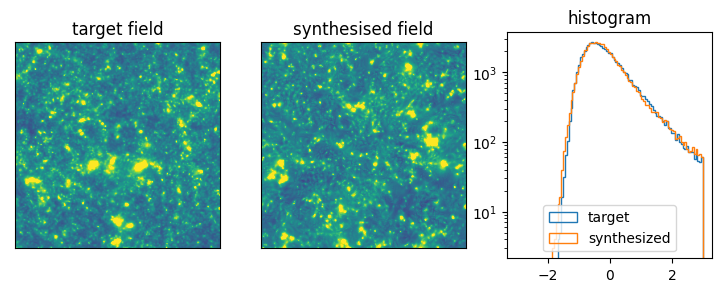

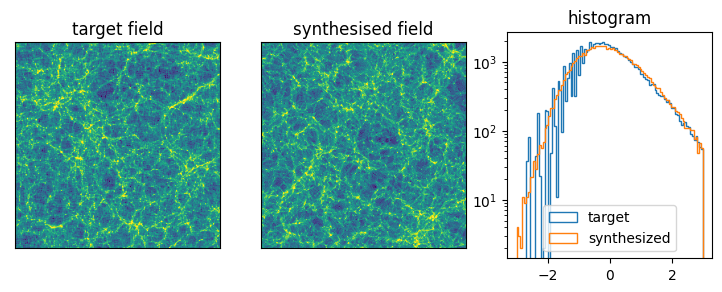

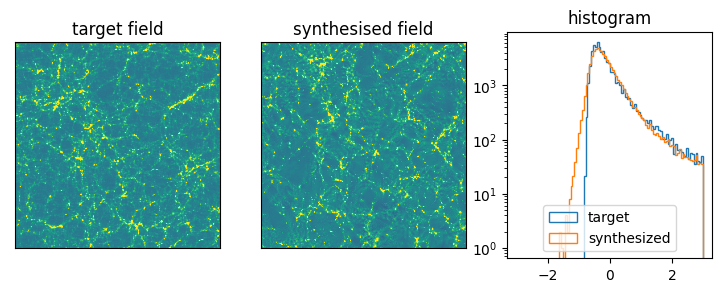

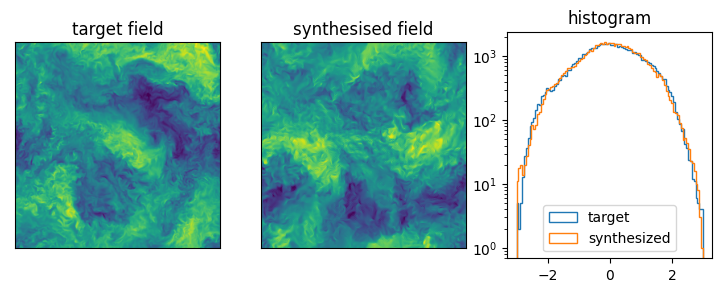

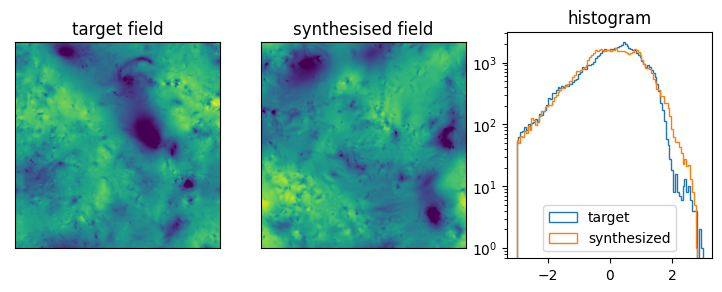

In [ ]:
# show synthesis results
show(image_target, image_syn, (-3, 3))

## 2.2 texture generation, given the value of coefs

### example 1: interpolation between textures

In [ ]:
# load two images
M = N = 256; J = 7; L = 4
image_target1 = scattering.whiten(np.load(scattering.dirpath + '/example_fields.npy')[1:2,:M,:N])
image_target2 = scattering.whiten(np.load(scattering.dirpath + '/example_fields.npy')[0:1,:M,:N])

# calculate scattering correlations coefficients for each of them
st_calc = scattering.Scattering2d(M, N, J, L)
s_cov1 = st_calc.scattering_cov(image_target1)
s_cov2 = st_calc.scattering_cov(image_target2)

# linearly interpolate the coefficients between image1 and image2
coef_target_list = []
param_list = [0.75, 0.5, 0.25, 0.]
for factor in param_list:
    coef_target_list.append(
        factor * s_cov1['for_synthesis_iso'] + (1-factor) * s_cov2['for_synthesis_iso'])

# synthesize based on the values of interpolated coefficients
image_syn = scattering.synthesis(
    's_cov_iso', mode='estimator', M=M, N=N, J=J, L=L, 
    target=torch.cat(coef_target_list, dim=0),
    image_init=image_target1 * np.ones((len(param_list),1,1)),
    steps=200, seed=0
)

# of estimators:  2927
max residual:  1.2190745 , mean residual:  0.0049007237
max residual:  0.008856286 , mean residual:  0.00015675159
time used:  25.746376514434814 s


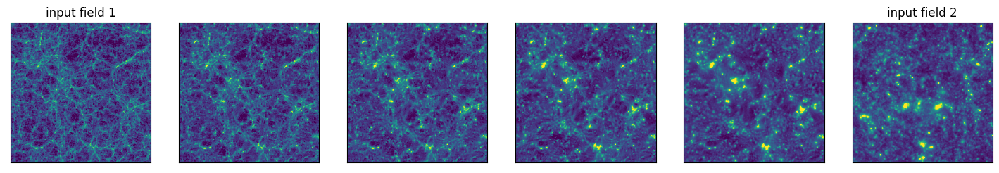

In [ ]:
# plot result
image_series = np.concatenate(
    (image_target1[0:1], image_syn, image_target2[0:1]), axis=0)

plt.figure(figsize=(len(image_series)*3,3),dpi=100)
for i in range(len(image_series)):
    plt.subplot(1,len(image_series),i+1)
    plt.imshow(image_series[i], vmin=-1.5, vmax=5)
    if i == 0: plt.title('input field 1')
    if i == len(image_series)-1: plt.title('input field 2')
    plt.xticks([]); plt.yticks([])

### example 2: changing the overall amplitude of one type of coef.

In [ ]:
# define calculators
M = N = 256; J = 7; L = 4
st_calc = scattering.Scattering2d(M, N, J, L)
# load image
image_input = scattering.whiten(scattering.whiten(
    np.load(scattering.dirpath + '/example_fields.npy')[1:2,:M,:N]))
# calculate estimators
s_cov_set = st_calc.scattering_cov(image_input)
index_type, j1, j2, j3, l1, l2, l3 = s_cov_set['index_for_synthesis_iso']

In [ ]:
# change the overall amplitude of C01 coefficients
s_cov_list = []
param_list1 = [-2, -1, 0, 1, 2]
for factor in param_list1:
    s_cov = s_cov_set['for_synthesis_iso']*1.
    s_cov[:,(index_type==3)+(index_type==4)] *= factor # C01_real/imag is scaled by a factor
    s_cov_list.append(s_cov)

# change the overal amplitude of C11 coefficients
param_list2 = [0.8, 1, 1.5, 2]
for factor in param_list2:
    s_cov = s_cov_set['for_synthesis_iso']*1.
    s_cov[:,(index_type==5)+(index_type==6)] *= factor # C11_real/imag is scaled by a factor
    s_cov_list.append(s_cov)

# change the overal amplitude of both C01 and C11 coefficients
param_list3 = [0.8, 1, 1.5, 2]
for factor in param_list3:
    s_cov = s_cov_set['for_synthesis_iso']*1.
    s_cov[:,(index_type==3)+(index_type==4)] *= factor**2 # C10 are scaled by factor**0.5
    s_cov[:,(index_type==5)+(index_type==6)] *= factor # C11 are scaled by a factor
    s_cov_list.append(s_cov)

# synthesize based on values of coefficients
N_image = len(param_list1) + len(param_list2) + len(param_list3)
image_syn = scattering.synthesis(
    's_cov_iso', mode='estimator', M=M, N=N, J=J, L=L,
    target=torch.cat(s_cov_list, dim=0), 
    image_init=image_input * np.ones((N_image,1,1))
)

# of estimators:  2927
max residual:  0.2412923 , mean residual:  0.0011801118
max residual:  0.088100314 , mean residual:  0.0005062636
time used:  63.531776666641235 s


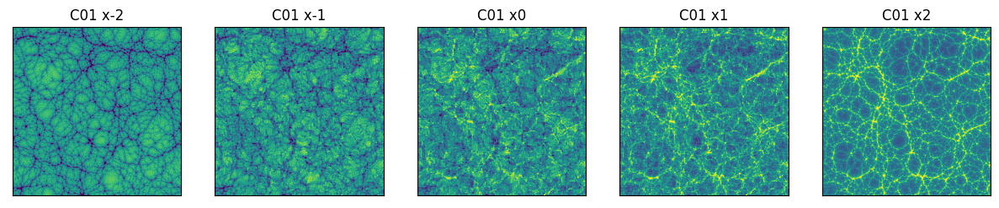

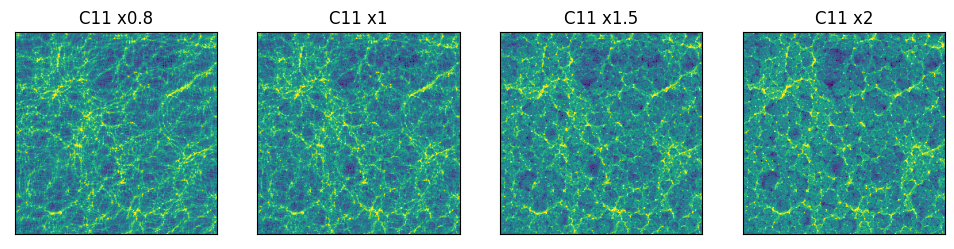

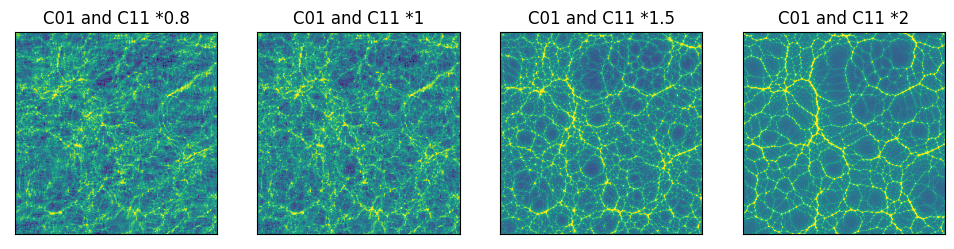

In [ ]:
# plot result
start_index = [0, len(param_list1), len(param_list1)+len(param_list2)]
name_list = [['C01 x' for i in range(len(param_list1))],
            ['C11 x' for i in range(len(param_list2))],
            ['C01 and C11 *' for i in range(len(param_list3))]]

for list_index, param_list in enumerate([param_list1, param_list2, param_list3]):
    plt.figure(figsize=(len(param_list)*3,3), dpi=100)
    for i in range(len(param_list)):
        plt.subplot(1, len(param_list), i+1)
        plt.imshow(image_syn[i+start_index[list_index]], vmin=-3, vmax=3)
        plt.title(name_list[list_index][i] + str(param_list[i])); plt.xticks([]); plt.yticks([])
    plt.show()

### example 3: changing orientation amplitude

In [ ]:
# define calculators
M = N = 256; J = 7; L = 4
st_calc = scattering.Scattering2d(M, N, J, L)

# load image
image_input = scattering.whiten(scattering.whiten(
    np.load(scattering.dirpath + '/example_fields.npy')[1:2,:M,:N]))

# calculate estimators
s_cov_set = st_calc.scattering_cov(image_input)
index_type, j1, j2, j3, l1, l2, l3 = s_cov_set['index_for_synthesis_iso']

# of estimators:  2927
max residual:  0.17195559 , mean residual:  0.0020406947
max residual:  0.07272935 , mean residual:  0.00082177354
time used:  89.27300238609314 s


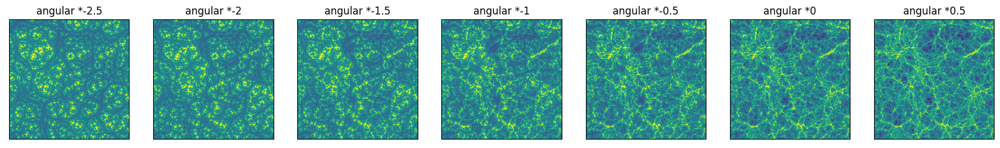

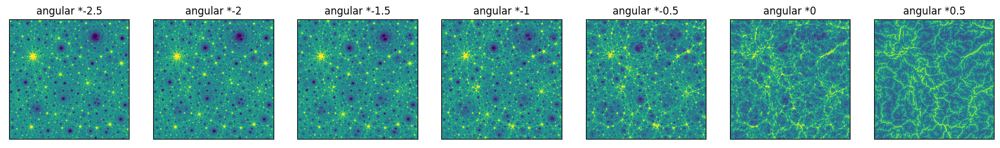

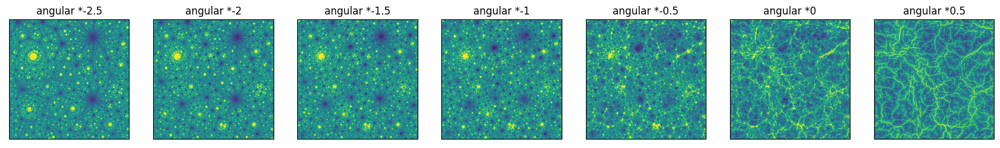

# of estimators:  2927
max residual:  0.08968302 , mean residual:  0.0010009484
max residual:  0.025219444 , mean residual:  0.00044086212
time used:  89.21739840507507 s


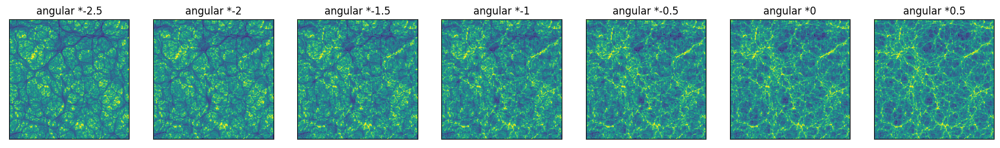

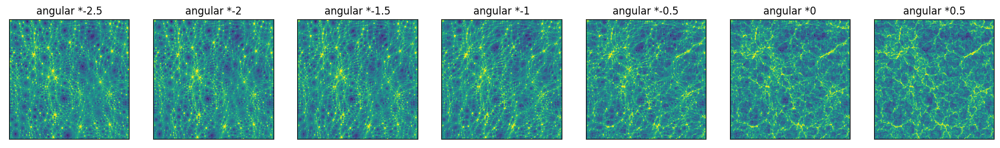

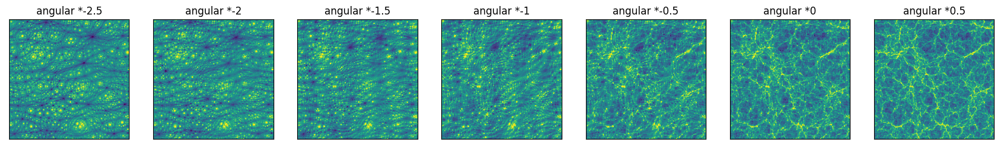

In [ ]:
# change the orientation amplitude of C01 and C11 (keep the l1=l2=l3 coef)
# change the orientation amplitude of C01 and C11 (keep the mean)
for keep_para in [True, False]:
    s_cov_list = []
    param_list1 = [-2.5, -2, -1.5, -1, -0.5, 0, 0.5]
    for factor in param_list1:
        s_cov = scattering.modify_angular(s_cov_set, factor, C01=True, keep_para=keep_para)
        s_cov_list.append(s_cov)

    param_list2 = [-2.5, -2, -1.5, -1, -0.5, 0, 0.5]
    for factor in param_list2:
        s_cov = scattering.modify_angular(s_cov_set, factor, C11=True, keep_para=keep_para)
        s_cov_list.append(s_cov)

    param_list3 = [-2.5, -2, -1.5, -1, -0.5, 0, 0.5]
    for factor in param_list3:
        s_cov = scattering.modify_angular(s_cov_set, factor, C01=True, C11=True, keep_para=keep_para)
        s_cov_list.append(s_cov)

    # synthesize based on values of coefficients
    N_image = len(param_list1) + len(param_list2) + len(param_list3)
    image_syn = scattering.synthesis(
        's_cov_iso', mode='estimator', M=M, N=N, J=J, L=L,
        target=torch.cat(s_cov_list, dim=0), 
        image_init=image_input * np.ones((N_image,1,1))
    )
    # plot
    start_index = [0, len(param_list1), len(param_list1)+len(param_list2)]
    for list_index, param_list in enumerate([param_list1, param_list2, param_list3]):
        plt.figure(figsize=(len(param_list)*3,3), dpi=100)
        for i in range(len(param_list)):
            plt.subplot(1,len(param_list),i+1)
            plt.imshow(image_syn[i+start_index[list_index]], vmin=-3, vmax=3)
            plt.title('angular *'+str(param_list[i])); plt.xticks([]); plt.yticks([])
        plt.show()

### draft

In [ ]:
# check convergence (solid/dashed lines are target coef / coef of synthesized images)
s_cov_syn = st_calc.scattering_cov(image_syn, flatten=True)
coef_syn = s_cov_syn['for_synthesis_iso'].cpu()

for i in range(len(param_list)):
    plt.plot(coef_target[i,index_type==3].reshape(-1,4)[:,0], color='C'+str(i), ls='-')
    plt.plot(coef_syn[i,index_type==3].reshape(-1,4)[:,0], color='C'+str(i), ls='--')
plt.show()

for i in range(len(param_list)):
    plt.plot(coef_target[i,index_type==5].reshape(-1,4,4)[:,0,0], color='C'+str(i), ls='-')
    plt.plot(coef_syn[i,index_type==5].reshape(-1,4,4)[:,0,0], color='C'+str(i), ls='--')
plt.show()

In [ ]:
# # other ways to load images
# image_target1 = np.load(data_dir + 'H_51.npy')[:1,:256,:256]
# image_target2 = np.log(np.load(data_dir + 'H81_0_Quijote.npy')[None,:256,:256]+1)
# image_target3 = np.load(data_dir + 'turbulence/iso/iso_u_t1z1.npy')[None,:,:,1,0]
# image_target4 = np.load(data_dir + 'turbulence/iso/iso_p_t1z1.npy')[None,:,:,1,0]
# for level in range(2):
#     image_target3 = scattering.binning2x2(image_target3)
#     image_target4 = scattering.binning2x2(image_target4)
# image_target5 = np.load(data_dir + 'turbulence/iso/iso_u_t1z1.npy')[None,:512,:512,1,0]
# image_target6 = np.load(data_dir + 'turbulence/iso/iso_p_t1z1.npy')[None,:512,:512,1,0]
# for level in range(1):
#     image_target5 = scattering.binning2x2(image_target5)
#     image_target6 = scattering.binning2x2(image_target6)

## 2.3 two fields, image target

In [ ]:
# # load image
# image_target = np.load(data_dir + 'turbulence/iso/iso_u_t1z1.npy')[None,:,:,1,0]
# image_b      = np.load(data_dir + 'turbulence/iso/iso_p_t1z1.npy')[None,:,:,1,0]

# # 2x2 binning (make the images smaller)
# for level in range(2):
#     image_target = scattering.binning2x2(image_target)
#     image_b      = scattering.binning2x2(image_b)

# load image
image_target = np.load(scattering.dirpath + '/example_fields.npy')[3:4]
image_b      = np.load(scattering.dirpath + '/example_fields.npy')[4:5]

# synthesize
image_syn = scattering.synthesis('s_cov_2fields_iso', mode='image', 
    target=image_target, image_b=image_b, image_init='random phase',
    steps=800, learning_rate=0.5, seed=0,
)

input_size:  (1, 256, 256)
# of estimators:  8086
max residual:  0.28264487 , mean residual:  0.002795604
max residual:  0.00022033788 , mean residual:  1.34883885e-05
time used:  198.69255828857422 s


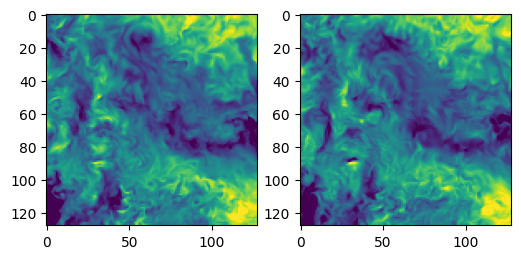

In [ ]:
# s_cov_iso, step=800, 199s, t1z1, P00, from GRF, 0.5
plt.figure(figsize=(6,3),dpi=100)
plt.subplot(121); plt.imshow(image_target[0,:128,:128], vmin=-1.5, vmax=1.5)
plt.subplot(122); plt.imshow(image_syn   [0,:128,:128], vmin=-1.5, vmax=1.5)
plt.show()

### synthesis results with other settings

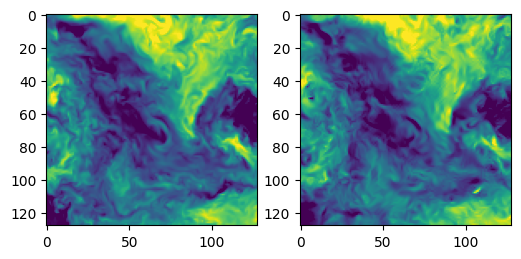

In [ ]:
# s_cov_iso, step=800, 308s, t501z1, P00, from GRF, another field

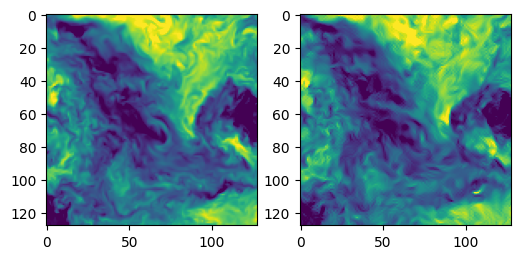

In [ ]:
# s_cov_iso, step=800, 308s, t501z1, P00, from WN, 0.5

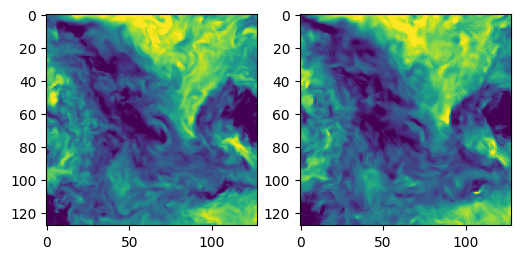

In [ ]:
# s_cov_iso, step=800, 299s, t501z1, P00, from WN, 0.2

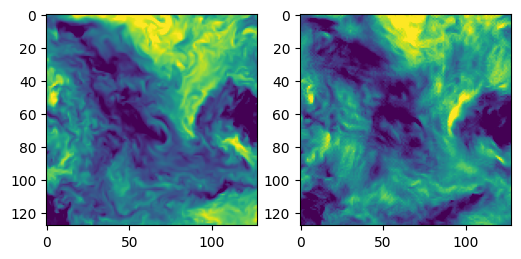

In [ ]:
# s_cov_iso, step=800, 300s, t501z1, P11, from WN, 0.2

### for comparison: single field synthesis

input_size:  (1, 256, 256)
# of estimators:  2927
max residual:  0.1281147 , mean residual:  0.0022877108
max residual:  0.0029159859 , mean residual:  0.00013558318
time used:  37.15957832336426 s


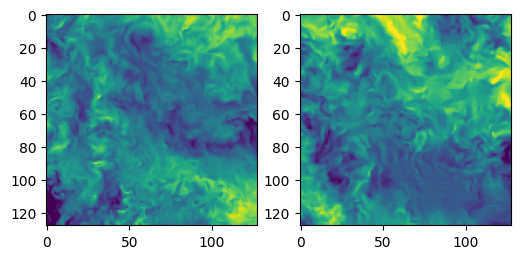

In [ ]:
# load image
image_target = np.load(scattering.dirpath + '/example_fields.npy')[3:4] # z-velocity of turbulence
image_b      = np.load(scattering.dirpath + '/example_fields.npy')[4:5] # pressure of turbulence
# s_cov_iso single field
image_syn = scattering.synthesis('s_cov_iso', image_target, image_init='random phase', seed=0)
# plot
plt.figure(figsize=(6,3),dpi=100)
plt.subplot(121); plt.imshow(image_target[0,:128,:128], vmin=-2, vmax=2)
plt.subplot(122); plt.imshow(image_syn   [0,:128,:128], vmin=-2, vmax=2)
plt.show()